In [68]:
# Importar las librerías necesarias
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as sns  

from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA  
from sklearn.cluster import KMeans  


In [69]:
# Establecer el random seed
random_seed = 42
np.random.seed(random_seed)

# Cargar y Explorar los Datos
Carga el archivo parquet usando pandas y realiza una exploración inicial de los datos, incluyendo estadísticas descriptivas y visualización de distribuciones.

In [70]:
# Cargar el archivo parquet
file_path = '../../data/processed/merged_inmuebles24_departamentos_20251005.parquet'
df = pd.read_parquet(file_path)

In [71]:
# Exploración inicial de los datos
# Mostrar las primeras filas del DataFrame
print("Primeras filas del DataFrame:")
df.head()


Primeras filas del DataFrame:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,...,VPH_AEASP,VIVPAR_UT,TVIVPAR,VPH_3YMASC,P_18YMAS,POB65_MAS,VPH_TV,PROM_OCUP,POBTOT,_merge
0,12000.0,50,1.0,1.0,1.0,1,0,0,1,1,...,53.113636,0.261364,58.886364,50.863636,122.829545,25.840909,51.579545,2.678523,142.488636,both
1,34100.0,232,3.0,4.0,2.0,0,0,1,1,1,...,66.542435,0.605166,68.051661,50.210332,186.833948,26.520295,64.922509,3.482731,238.413284,both
2,26000.0,180,3.0,2.0,2.0,0,0,1,0,1,...,96.952465,1.360915,104.586268,79.426056,260.887324,31.665493,94.616197,3.499225,338.739437,both
3,32000.0,120,2.0,2.0,2.0,0,0,0,1,0,...,31.860870,3.695652,40.365217,29.243478,80.008696,19.478261,30.921739,2.969652,94.991304,both
4,23000.0,103,2.0,2.0,2.0,0,0,1,1,1,...,138.483871,15.322581,128.387097,126.161290,314.709677,73.516129,136.741935,2.647097,368.612903,both


In [72]:
# Información general del DataFrame
print("\nInformación general del DataFrame:")
df.info()



Información general del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11868 entries, 0 to 11867
Columns: 119 entries, precio_mxn to _merge
dtypes: Int64(1), category(1), float64(96), int64(16), object(5)
memory usage: 10.7+ MB


In [73]:
# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
df.describe(include='all')


Estadísticas descriptivas:


,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,...,VPH_AEASP,VIVPAR_UT,TVIVPAR,VPH_3YMASC,P_18YMAS,POB65_MAS,VPH_TV,PROM_OCUP,POBTOT,_merge
count,11868.000000,11772.0,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.0000,...,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868.000000,11868
unique,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
top,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,both
freq,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11868
mean,36803.241146,484.858902,1.926946,1.725396,1.318841,0.303505,0.037159,0.310583,0.544068,0.2318,...,74.112832,2.272674,76.218677,63.758182,187.578133,26.780012,72.511043,2.904841,234.327619,NaN
std,28548.559862,18403.557958,0.836094,0.768911,0.865113,0.459791,0.189159,0.462752,0.498075,0.4220,...,50.412913,2.537513,46.719576,45.157039,131.756314,16.532131,49.923942,0.556485,175.079118,NaN
min,12.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,...,0.000000,0.000000,0.714286,0.000000,1.342857,0.000000,0.442857,0.167143,2.671429,NaN
25%,19803.250000,61.0,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0000,...,39.604651,0.348837,41.186047,30.511628,116.883721,17.302326,38.767442,2.517275,147.395349,NaN
50%,28720.000000,87.0,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.0000,...,62.305455,1.066667,61.015106,52.767273,158.913534,21.840000,60.523636,3.112473,193.423188,NaN
75%,43000.000000,130.0,2.000000,2.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.0000,...,73.736377,4.321060,83.789396,65.551378,173.567010,27.171642,71.372607,3.406744,226.556364,NaN


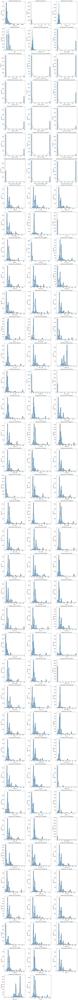

In [74]:
# Visualización de distribuciones
# Seleccionar columnas numéricas
numeric_columns = df.select_dtypes(include=[np.number]).columns

# Crear subplots para las columnas numéricas
num_cols = len(numeric_columns)
fig, axes = plt.subplots(nrows=(num_cols // 3) + 1, ncols=3, figsize=(15, 5 * ((num_cols // 3) + 1)))
axes = axes.flatten()

for i, column in enumerate(numeric_columns):
    sns.histplot(df[column], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"Distribución de {column}")
    axes[i].set_xlabel(column)
    axes[i].set_ylabel("Frecuencia")

# Eliminar ejes vacíos si hay menos subplots que espacios
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

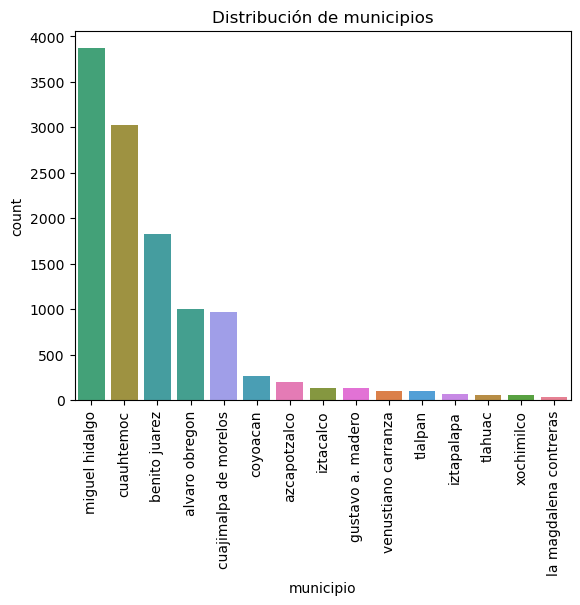

In [75]:
municipio_order = df['municipio'].value_counts().index

sns.countplot(data=df, x='municipio', order=municipio_order, hue='municipio')
plt.xticks(rotation=90)
plt.title('Distribución de municipios')
plt.show()

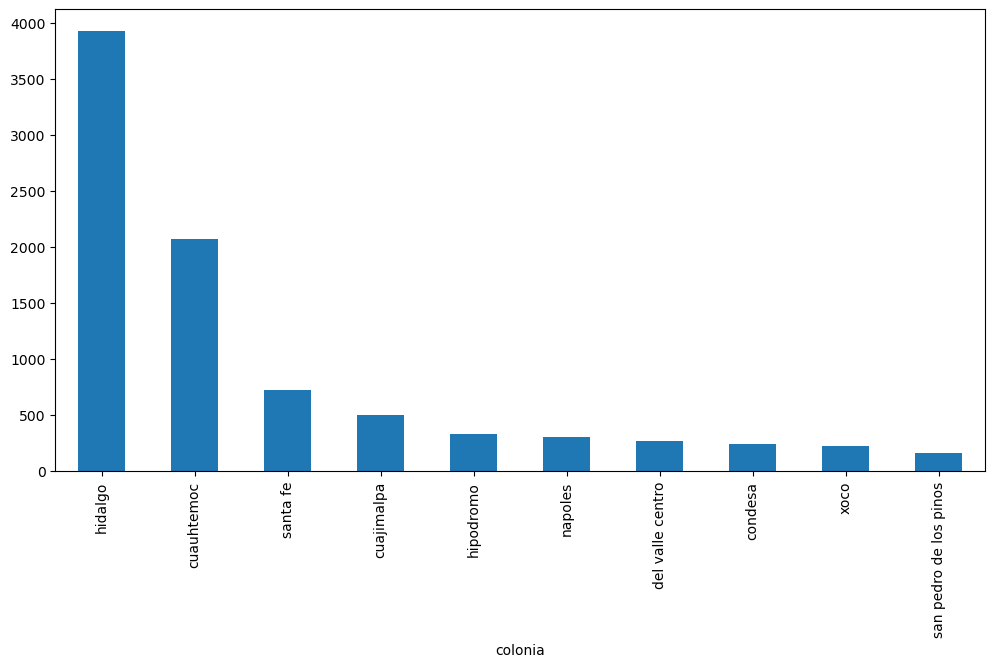

In [76]:
df.colonia.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

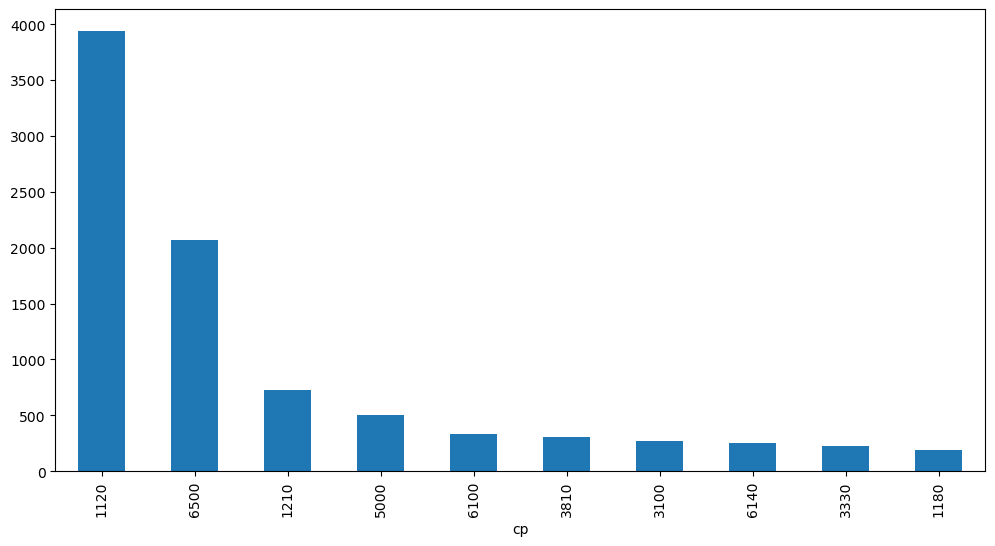

In [77]:
# Un CP puede contener varias colonias, así que nos quedamos sólo con colonias
df.cp.value_counts().head(10).plot(kind='bar', figsize=(12,6))
plt.show()

In [78]:
top10_cols= list(df.colonia.value_counts().head(10).index)

In [79]:
df['colonia_top10'] = df['colonia'].where(df['colonia'].isin(top10_cols), 'otros')

# Preprocesamiento de Datos
Aplica técnicas de limpieza de datos, manejo de valores nulos y codificación de variables categóricas.

In [80]:
# Identificar valores nulos en el DataFrame
print("\nValores nulos por columna:")
df.isnull().sum().sort_values(ascending=False)


Valores nulos por columna:


lote_m2                              96
precio_mxn                            0
P_6A11                                0
VPH_DSADMA                            0
VPH_CEL                               0
VPH_NDACMM                            0
P_15A17_F                             0
VPH_RADIO                             0
VPH_AGUAFV                            0
P_8A14                                0
VPH_2YMASD                            0
P_3A5_F                               0
P_0A2_M                               0
VPH_SINRTV                            0
VPH_LAVAD                             0
P_12A14                               0
P_12A14_M                             0
P_8A14_F                              0
P_18YMAS_M                            0
VPH_CVJ                               0
P_3A5_M                               0
VPH_DRENAJ                            0
POBMAS                                0
P_0A2                                 0
VPH_1DOR                              0


In [81]:
# outliers
# Función para detectar outliers usando el método del rango intercuartílico (IQR) 
def detectar_outliers_iqr(data, columna):
    Q1 = data[columna].quantile(0.25)
    Q3 = data[columna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    outliers = data[(data[columna] < limite_inferior) | (data[columna] > limite_superior)]
    return outliers

In [82]:
cols = ['precio_mxn', 'lote_m2', 'recamaras', 'baños', 'estacionamiento']


Número de outliers en precio_mxn: 940
     precio_mxn
90     111960.0
115     80000.0
127     78000.0
175     80000.0
202    121290.0

Número de outliers en lote_m2: 1023
     lote_m2
6        273
7        405
33      1200
77       250
111      575

Número de outliers en recamaras: 186
     recamaras
6          5.0
33         6.0
352        4.0
638        4.0
690        4.0

Número de outliers en baños: 211
     baños
1      4.0
6      4.0
352    4.0
392   12.0
433    4.0

Número de outliers en estacionamiento: 177
      estacionamiento
188              22.0
580               4.0
705               4.0
746               4.0
1416              7.0


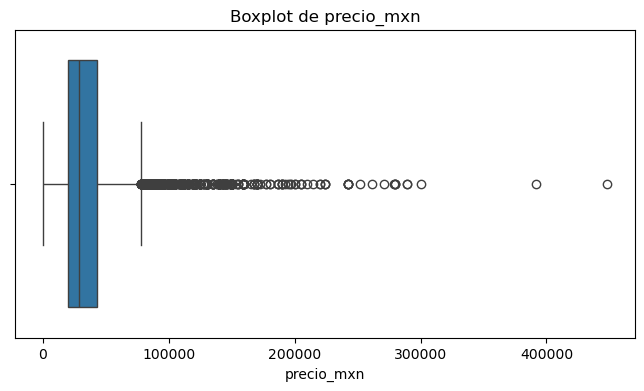

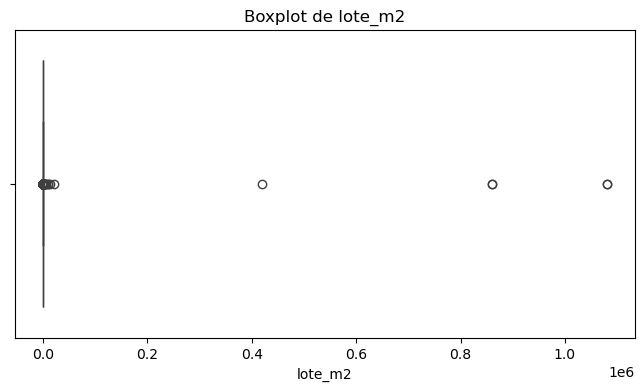

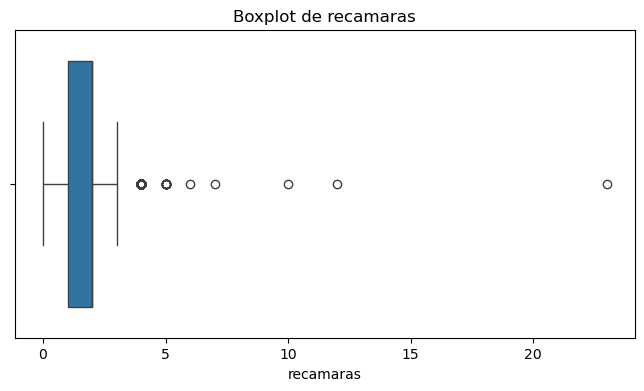

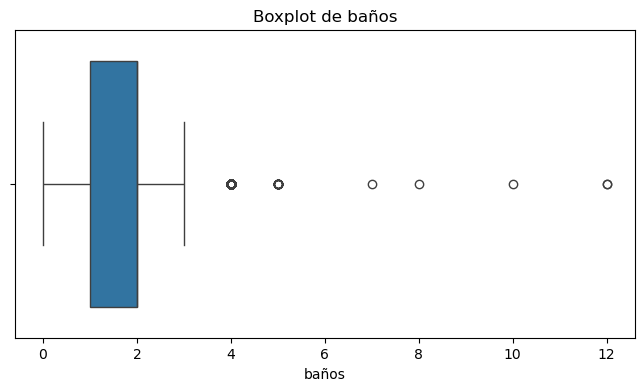

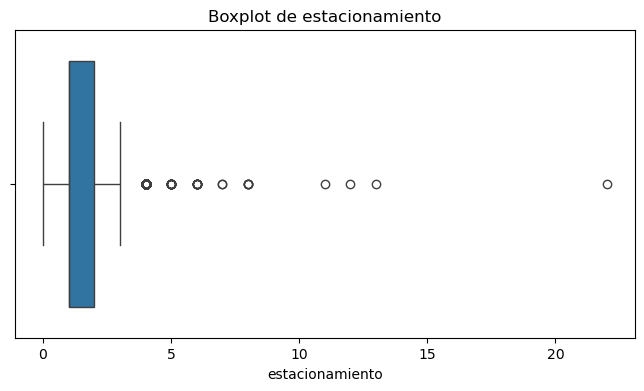

In [83]:
# Aplicar la función a las columnas numéricas
for col in cols:
    outliers = detectar_outliers_iqr(df, col)
    print(f"\nNúmero de outliers en {col}: {len(outliers)}")
    if len(outliers) > 0:
        print(outliers[[col]].head())
    # Visualizar outliers
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot de {col}")  

identificamos 2 outliers evidentes y muy seprados del resto de los datos en lote_m2, los cuales eliminamos

In [84]:
df.sort_values('lote_m2', ascending=False).head(5)

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,...,VIVPAR_UT,TVIVPAR,VPH_3YMASC,P_18YMAS,POB65_MAS,VPH_TV,PROM_OCUP,POBTOT,_merge,colonia_top10
11685,22000.0,1080000,3.0,2.0,1.0,0,0,0,1,0,...,0.164835,49.252747,39.714286,126.318681,22.164835,46.263736,3.103736,160.406593,both,otros
4482,22000.0,1080000,3.0,2.0,1.0,0,0,0,1,0,...,0.164835,49.252747,39.714286,126.318681,22.164835,46.263736,3.103736,160.406593,both,otros
5533,26000.0,860000,2.0,2.0,2.0,1,0,1,0,0,...,4.321060,83.789396,62.896907,173.567010,23.640648,71.372607,2.517275,210.988218,both,cuauhtemoc
10406,26000.0,860000,2.0,2.0,2.0,1,0,1,0,0,...,4.321060,83.789396,62.896907,173.567010,23.640648,71.372607,2.517275,210.988218,both,cuauhtemoc
11314,19000.0,420000,1.0,1.0,1.0,0,0,1,0,1,...,0.571429,31.142857,29.357143,75.000000,16.642857,29.142857,2.375000,94.285714,both,otros


In [85]:
# Identificar los índices de los dos outliers más grandes
outliers = df.sort_values('lote_m2', ascending=False).head(2).index

In [86]:
# Eliminar los outliers del DataFrame
df = df.drop(outliers)


In [87]:
categorical_columns = list(df.select_dtypes(include=["object", "category"]).columns)
categorical_columns.remove('direccion')

In [88]:
df = pd.get_dummies(df, columns=['municipio','colonia_top10'], drop_first=True)

In [89]:
df.head()

,precio_mxn,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,...,colonia_top10_cuajimalpa,colonia_top10_cuauhtemoc,colonia_top10_del valle centro,colonia_top10_hidalgo,colonia_top10_hipodromo,colonia_top10_napoles,colonia_top10_otros,colonia_top10_san pedro de los pinos,colonia_top10_santa fe,colonia_top10_xoco
0,12000.0,50,1.0,1.0,1.0,1,0,0,1,1,...,False,False,False,False,False,False,True,False,False,False
1,34100.0,232,3.0,4.0,2.0,0,0,1,1,1,...,False,False,False,False,False,False,True,False,False,False
2,26000.0,180,3.0,2.0,2.0,0,0,1,0,1,...,False,False,False,False,False,False,True,False,False,False
3,32000.0,120,2.0,2.0,2.0,0,0,0,1,0,...,False,False,False,False,False,False,True,False,False,False
4,23000.0,103,2.0,2.0,2.0,0,0,1,1,1,...,False,False,False,False,False,False,True,False,False,False


In [90]:
df.shape

(11866, 142)

# Clustering
Realiza un análisis de clustering para agrupar los datos en diferentes segmentos.

In [91]:
df_analysis = df.drop(['direccion','colonia','precio_mxn','cp','neighbourhood','_merge'], axis=1)

In [92]:
df_analysis['random'] = np.random.rand(len(df_analysis))

In [93]:
cols = df_analysis.columns

In [94]:
# Escalar los datos
scaler = StandardScaler()
df_analysis[cols] = scaler.fit_transform(df_analysis[cols])

In [95]:
## Arreglar los nulos y quitar esta celda
df_analysis = df_analysis.dropna()

In [96]:
df_analysis.dtypes[120:]

municipio_la magdalena contreras        float64
municipio_miguel hidalgo                float64
municipio_tlahuac                       float64
municipio_tlalpan                       float64
municipio_venustiano carranza           float64
municipio_xochimilco                    float64
colonia_top10_cuajimalpa                float64
colonia_top10_cuauhtemoc                float64
colonia_top10_del valle centro          float64
colonia_top10_hidalgo                   float64
colonia_top10_hipodromo                 float64
colonia_top10_napoles                   float64
colonia_top10_otros                     float64
colonia_top10_san pedro de los pinos    float64
colonia_top10_santa fe                  float64
colonia_top10_xoco                      float64
random                                  float64
dtype: object

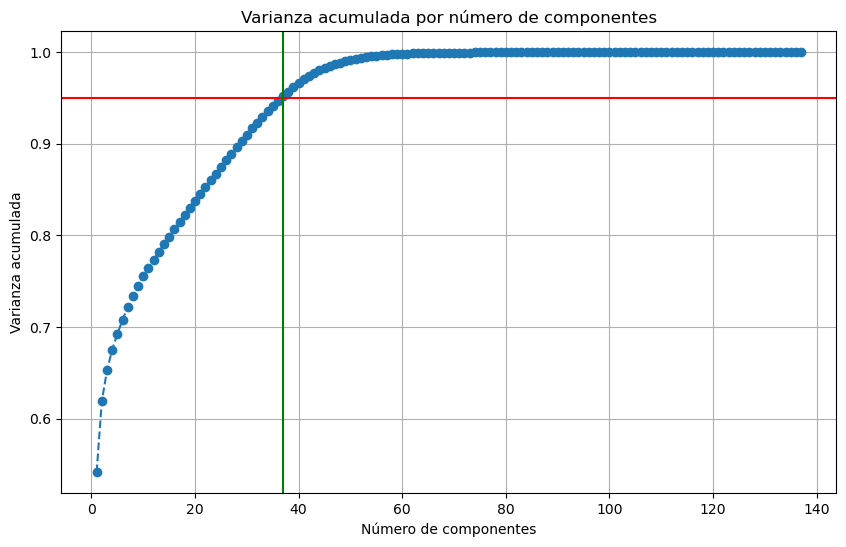

Número óptimo de componentes: 37


In [97]:
# Crear el modelo PCA sin especificar n_components
pca = PCA()
pca.fit(df_analysis)

# Calcular la varianza acumulada
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

#Gráfica de la varianza acumulada
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Varianza acumulada por número de componentes')
plt.xlabel('Número de componentes')
plt.ylabel('Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='-')
plt.axvline(x=np.argmax(cumulative_variance >= 0.95) + 1, color='g', linestyle='-')
plt.grid()
plt.show()

# Elegir el número de componentes que expliquen al menos el 95% de la varianza
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Número óptimo de componentes: {n_components}")



In [98]:
print("Varianza acumulada:")
print(cumulative_variance)


Varianza acumulada:
[0.54137537 0.61905666 0.65251316 0.67515111 0.69240859 0.70754476
 0.72203467 0.73420972 0.7448703  0.75514544 0.76481832 0.7734962
 0.78210508 0.79053662 0.79869437 0.80681964 0.81479902 0.82255624
 0.83021322 0.8378541  0.84534214 0.85279758 0.86019643 0.8675493
 0.87487117 0.88205036 0.88920115 0.89634209 0.90327999 0.91002523
 0.91671925 0.92308234 0.92934629 0.93550585 0.94136054 0.94686296
 0.95213726 0.95707941 0.96183781 0.96617016 0.9703712  0.97395072
 0.97735926 0.9802216  0.98264669 0.98479729 0.98683257 0.98855668
 0.99016408 0.99162044 0.99281954 0.99391887 0.99488121 0.99568727
 0.99635468 0.99692245 0.99736992 0.99775581 0.99805382 0.99833735
 0.99854554 0.99870883 0.99885167 0.9989859  0.99910696 0.99921052
 0.99930284 0.99938668 0.99945942 0.99952438 0.99958348 0.99963396
 0.99967741 0.99971867 0.99975542 0.9997896  0.99981849 0.99984293
 0.99986613 0.99988543 0.99990208 0.99991625 0.99992882 0.9999396
 0.99994917 0.99995722 0.99996361 0.99996941 

In [99]:
# Aplicar PCA con el número óptimo de componentes
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(df_analysis)

In [100]:
# Importancia de cada componente (varianza explicada)
explained_variance = pca.explained_variance_ratio_
print("Varianza explicada por cada componente:")
for i, var in enumerate(explained_variance):
    print(f"Componente {i+1}: {var:.2%}")

Varianza explicada por cada componente:
Componente 1: 54.14%
Componente 2: 7.77%
Componente 3: 3.35%
Componente 4: 2.26%
Componente 5: 1.73%
Componente 6: 1.51%
Componente 7: 1.45%
Componente 8: 1.22%
Componente 9: 1.07%
Componente 10: 1.03%
Componente 11: 0.97%
Componente 12: 0.87%
Componente 13: 0.86%
Componente 14: 0.84%
Componente 15: 0.82%
Componente 16: 0.81%
Componente 17: 0.80%
Componente 18: 0.78%
Componente 19: 0.77%
Componente 20: 0.76%
Componente 21: 0.75%
Componente 22: 0.75%
Componente 23: 0.74%
Componente 24: 0.74%
Componente 25: 0.73%
Componente 26: 0.72%
Componente 27: 0.72%
Componente 28: 0.71%
Componente 29: 0.69%
Componente 30: 0.67%
Componente 31: 0.67%
Componente 32: 0.64%
Componente 33: 0.63%
Componente 34: 0.62%
Componente 35: 0.59%
Componente 36: 0.55%
Componente 37: 0.53%


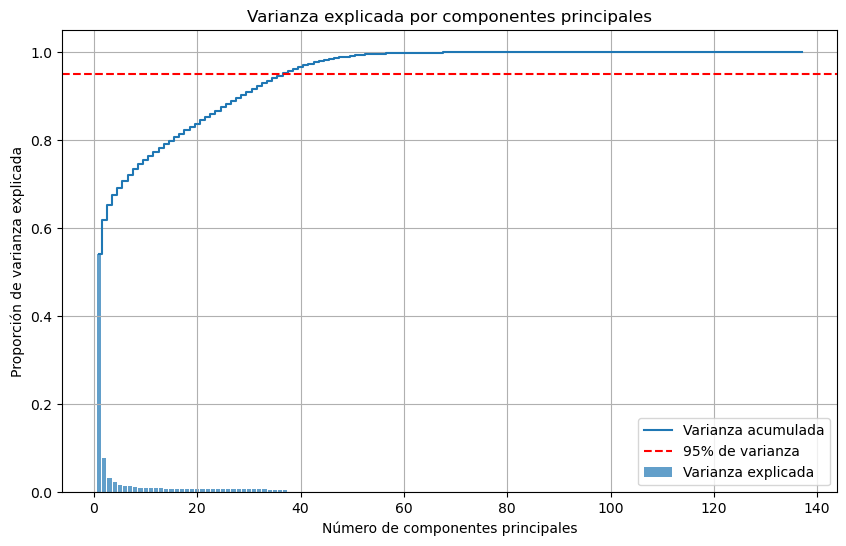

In [101]:
# Gráfica de varianza explicada por cada componente
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, label='Varianza explicada')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Varianza acumulada')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% de varianza')
plt.xlabel('Número de componentes principales')
plt.ylabel('Proporción de varianza explicada')
plt.title('Varianza explicada por componentes principales')
plt.legend(loc='best')
plt.grid()
plt.show()

In [102]:
# Contribución de las características originales a los primeros 22 componentes
components = pd.DataFrame(pca.components_[:20], columns=df_analysis.columns)
print("\nContribución de las características originales a los primeros 22 componentes:")
components.T.sort_values(by = 0, ascending=False)


Contribución de las características originales a los primeros 22 componentes:


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
P_18YMAS,0.115761,0.019666,-0.017279,0.006164,-0.005591,0.006721,-0.016780,0.007868,0.001558,-0.008660,0.002181,0.003480,0.004622,0.009179,-0.000308,0.010743,0.000034,0.000289,0.000772,0.001511
P_18YMAS_M,0.115715,0.020978,-0.007712,0.012458,-0.001446,0.000606,-0.020504,0.008143,0.003701,-0.006960,0.005180,0.003520,0.001108,0.007845,-0.002160,0.005956,0.001215,-0.000039,-0.002153,0.002661
P_18YMAS_F,0.115672,0.018529,-0.025457,0.000769,-0.009135,0.011929,-0.013593,0.007631,-0.000256,-0.010106,-0.000421,0.003450,0.007621,0.010317,0.001270,0.014824,-0.000970,0.000578,0.003273,0.000540
HOGJEF_M,0.115592,-0.022966,-0.014134,0.006924,0.001774,-0.017039,-0.001744,0.004895,0.005671,0.008179,0.003657,0.006199,-0.000576,0.004777,-0.008678,-0.004998,0.006474,-0.012340,-0.005752,-0.001077
PHOGJEF_F,0.115264,0.015577,-0.000305,0.001177,-0.009366,0.022757,-0.029944,0.010407,-0.016329,-0.021636,-0.003521,0.007717,0.004811,0.011834,0.009264,0.005175,-0.000767,0.000681,0.001754,0.021817
POBFEM,0.115155,0.037197,-0.021049,0.003965,-0.008337,0.009464,-0.004747,0.005891,0.006191,-0.007187,0.001416,-0.000743,0.004580,-0.003409,-0.002188,0.004774,-0.004382,-0.000902,0.002840,-0.004042
P_15A49_F,0.115099,0.034852,-0.000975,0.022457,0.005513,0.008081,0.001324,-0.002926,-0.017563,0.010948,-0.001346,0.014008,0.000507,0.004904,-0.001254,-0.004140,-0.002772,-0.013682,-0.003716,0.010221
POBTOT,0.115068,0.040663,-0.012839,0.008701,-0.004893,0.006627,-0.007163,0.005112,0.004728,-0.004915,0.003156,-0.000526,0.001766,-0.002757,-0.003044,0.001289,-0.002620,-0.002175,0.001084,-0.001984
POBHOG,0.115061,0.040904,-0.012395,0.009501,-0.004897,0.006283,-0.007936,0.004949,0.004304,-0.004242,0.003291,-0.000438,0.002447,-0.004378,-0.002895,0.000286,-0.003582,-0.003031,0.001513,-0.001519
OCUPVIVPAR,0.115061,0.040904,-0.012395,0.009501,-0.004897,0.006283,-0.007936,0.004949,0.004304,-0.004242,0.003291,-0.000438,0.002447,-0.004378,-0.002895,0.000286,-0.003582,-0.003031,0.001513,-0.001519


In [103]:
most_important_features = components.iloc[0].abs().sort_values(ascending=False).head(35)
print("Características más importantes del primer componente:")
print(most_important_features)

Características más importantes del primer componente:
P_18YMAS      0.115761
P_18YMAS_M    0.115715
P_18YMAS_F    0.115672
HOGJEF_M      0.115592
PHOGJEF_F     0.115264
POBFEM        0.115155
P_15A49_F     0.115099
POBTOT        0.115068
POBHOG        0.115061
OCUPVIVPAR    0.115061
TVIVPARHAB    0.114840
TOTHOG        0.114840
TVIVHAB       0.114840
POBMAS        0.114831
VIVPARH_CV    0.114829
VPH_C_ELEC    0.114824
VPH_TV        0.114806
VPH_EXCSA     0.114749
VPH_DRENAJ    0.114727
VPH_DSADMA    0.114692
VPH_RADIO     0.114460
VPH_2YMASD    0.114423
PHOGJEF_M     0.114111
VPH_CEL       0.114102
VPH_AGUADV    0.114063
VIVPAR_HAB    0.114003
VPH_C_SERV    0.113965
VIVTOT        0.113716
VPH_TINACO    0.113694
VPH_AEASP     0.113651
VPH_REFRI     0.113631
VPH_LAVAD     0.112640
TVIVPAR       0.112491
P18YM_PB      0.112098
P18YM_PB_M    0.112086
Name: 0, dtype: float64


In [104]:
# Reconstrucción aproximada de los datos originales
reconstructed_data = pca.inverse_transform(pca_data)

In [105]:

# Comparar los datos originales con los reconstruidos
print("Datos originales (primeras filas):")
df_analysis.head()

Datos originales (primeras filas):


,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,cuenta_con_balcon,...,colonia_top10_cuauhtemoc,colonia_top10_del valle centro,colonia_top10_hidalgo,colonia_top10_hipodromo,colonia_top10_napoles,colonia_top10_otros,colonia_top10_san pedro de los pinos,colonia_top10_santa fe,colonia_top10_xoco,random
0,-0.021199,-1.108554,-0.943317,-0.368604,1.514688,-0.196468,-0.671276,0.915568,1.820258,-0.233598,...,-0.460089,-0.152591,-0.70291,-0.169923,-0.162425,1.685268,-0.118749,-0.255472,-0.139968,-0.422239
1,-0.005853,1.283753,2.958180,0.787278,-0.660202,-0.196468,1.489701,0.915568,1.820258,-0.233598,...,-0.460089,-0.152591,-0.70291,-0.169923,-0.162425,1.685268,-0.118749,-0.255472,-0.139968,1.579183
2,-0.010238,1.283753,0.357182,0.787278,-0.660202,-0.196468,1.489701,-1.092218,1.820258,-0.233598,...,-0.460089,-0.152591,-0.70291,-0.169923,-0.162425,1.685268,-0.118749,-0.255472,-0.139968,0.819427
3,-0.015297,0.087600,0.357182,0.787278,-0.660202,-0.196468,-0.671276,0.915568,-0.549373,-0.233598,...,-0.460089,-0.152591,-0.70291,-0.169923,-0.162425,1.685268,-0.118749,-0.255472,-0.139968,0.356268
4,-0.016730,0.087600,0.357182,0.787278,-0.660202,-0.196468,1.489701,0.915568,1.820258,-0.233598,...,-0.460089,-0.152591,-0.70291,-0.169923,-0.162425,1.685268,-0.118749,-0.255472,-0.139968,-1.181304


In [106]:
print("\nDatos reconstruidos (primeras filas):")
pd.DataFrame(reconstructed_data, columns=df_analysis.columns).head()


Datos reconstruidos (primeras filas):


,lote_m2,recamaras,baños,estacionamiento,es_amueblado,es_penthouse,cuenta_con_cocina_integral,cuenta_con_sala,cuenta_con_closet,cuenta_con_balcon,...,colonia_top10_cuauhtemoc,colonia_top10_del valle centro,colonia_top10_hidalgo,colonia_top10_hipodromo,colonia_top10_napoles,colonia_top10_otros,colonia_top10_san pedro de los pinos,colonia_top10_santa fe,colonia_top10_xoco,random
0,-0.042525,-1.250243,-1.030842,-0.542638,1.350061,-0.035274,-0.485544,-0.137471,1.727649,-0.018440,...,-0.784560,-0.481440,-0.607592,-0.331576,-0.397279,1.953370,0.447992,0.655450,-0.586833,-0.468521
1,-0.052009,1.637573,1.664367,1.490295,-0.752960,0.085311,1.886145,0.629228,1.839677,-0.126028,...,-0.813945,-0.921522,-0.152753,-0.465868,-0.771495,1.879834,-0.225650,0.599360,-0.941537,1.609991
2,-0.044305,0.766020,0.709094,0.656057,-0.655944,0.009251,1.970726,-1.366698,1.791907,-0.311952,...,-0.863433,-0.584141,-0.354671,-0.360024,-0.460421,1.829891,-0.317030,0.198484,-0.448659,0.894893
3,-0.027485,0.275391,0.228890,0.513780,-0.493296,0.058769,-0.258557,0.682869,-0.368382,-0.247514,...,-0.810422,-0.704253,-0.479537,-0.217877,-0.471068,2.121944,-0.298315,0.638300,-1.056401,0.383011
4,-0.040643,0.098942,0.307908,0.691649,-0.497598,-0.282258,1.541388,0.875810,2.002542,-0.292279,...,-0.412823,-0.043401,-1.109963,0.097453,-0.215959,2.416327,-0.590002,-0.889588,-0.050671,-1.146853


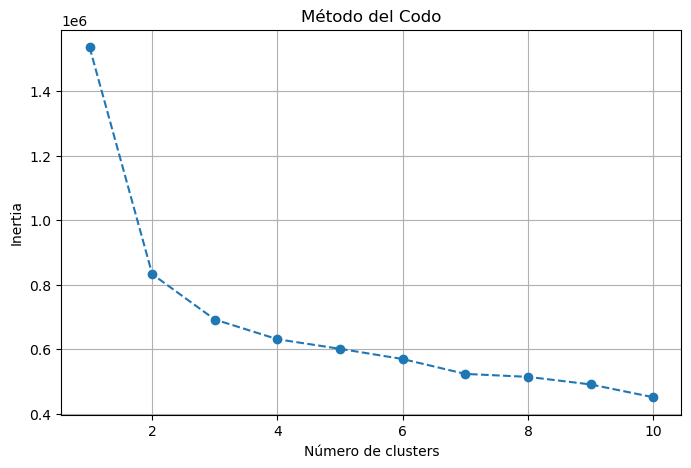

In [107]:
# Calcular la inertia para diferentes números de clusters
inertia = []
for k in range(1, 11):  # Probar de 1 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)  # Usa los datos reducidos por PCA
    inertia.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Inertia')
plt.title('Método del Codo')
plt.grid()
plt.show()

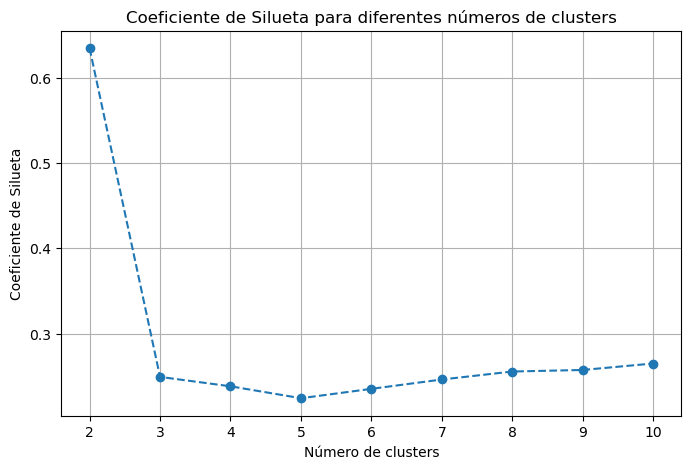

In [108]:
from sklearn.metrics import silhouette_score

# Calcular el coeficiente de silueta para diferentes números de clusters
silhouette_scores = []
for k in range(2, 11):  # Probar de 2 a 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_data)
    score = silhouette_score(pca_data, kmeans.labels_)
    silhouette_scores.append(score)

# Graficar el coeficiente de silueta
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), silhouette_scores, marker='o', linestyle='--')
plt.xlabel('Número de clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta para diferentes números de clusters')
plt.grid()
plt.show()

In [109]:
# Aplicar el algoritmo K-Means para clustering
num_clusters = 2
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(df_analysis)

/var/folders/c7/mdvpp7_n2dj49y88d6cj51kc0000gn/T/ipykernel_37461/1743315256.py:2: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



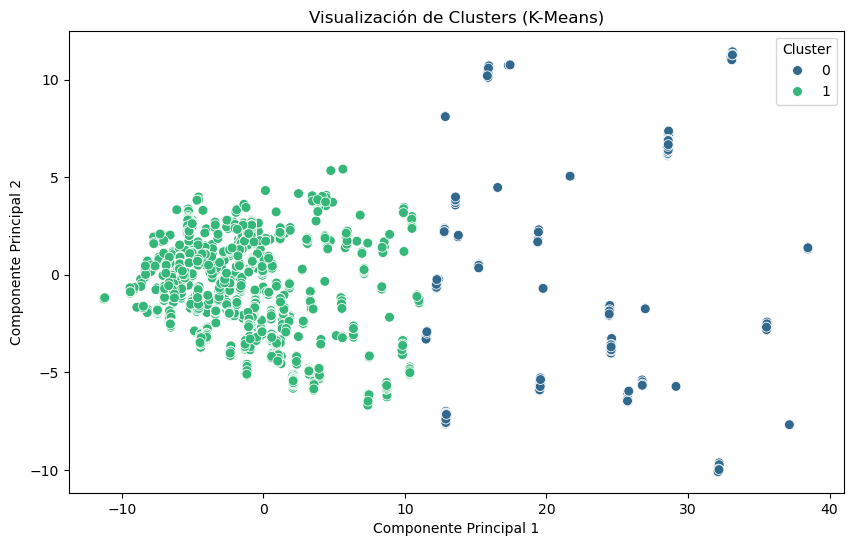

In [110]:

# Agregar los clusters al DataFrame original
df_analysis['Cluster'] = clusters

# Visualizar los clusters en el espacio reducido por PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_data[:, 0], y=pca_data[:, 1], hue=clusters, palette="viridis", s=50)
plt.title("Visualización de Clusters (K-Means)")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend(title="Cluster")
plt.show()

In [111]:
import plotly.express as px

# Crear un DataFrame con los datos de PCA y clusters
df_pca = pd.DataFrame(pca_data[:,:3], columns=['PC1', 'PC2', 'PC3'])  # Asegúrate de que pca_data tenga al menos 3 componentes
df_pca['Cluster'] = clusters  # Agregar los clusters al DataFrame

# Graficar en 3D con plotly
fig = px.scatter_3d(
    df_pca,
    x='PC1', y='PC2', z='PC3',  # Ejes del gráfico
    color='Cluster',            # Colorear por cluster
    title="Visualización de Clusters en 3D (K-Means)",
    opacity=0.3,                # Transparencia de los puntos
    size_max=1,                 # Tamaño máximo de los puntos
    symbol_sequence=['circle'], # Usar círculos como símbolo
    color_continuous_scale='Viridis'  # Paleta de colores
)

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=600,  # Ancho del gráfico
    height=600   # Alto del gráfico
)

# Mostrar el gráfico interactivo
fig.show()

In [112]:
# Mostrar el tamaño de cada cluster
cluster_sizes = df_analysis['Cluster'].value_counts()
print("\nTamaño de cada cluster:")
cluster_sizes


Tamaño de cada cluster:


Cluster
1    10713
0     1057
Name: count, dtype: int64

In [113]:
# Calcular las características promedio de cada cluster
numeric_columns = df_analysis.select_dtypes('number')
cluster_means = numeric_columns.groupby(df_analysis['Cluster']).mean()
cluster_means.T

Cluster,0,1
lote_m2,-0.015531,0.001532
recamaras,0.090995,-0.004962
baños,0.207077,-0.013435
estacionamiento,0.365168,-0.031216
es_amueblado,-0.335100,0.029843
es_penthouse,0.118613,-0.010929
cuenta_con_cocina_integral,-0.037498,0.006689
cuenta_con_sala,0.070284,-0.008205
cuenta_con_closet,-0.013571,0.003608
cuenta_con_balcon,-0.096926,0.009550


In [114]:
df_analysis.columns

Index(['lote_m2', 'recamaras', 'baños', 'estacionamiento', 'es_amueblado',
       'es_penthouse', 'cuenta_con_cocina_integral', 'cuenta_con_sala',
       'cuenta_con_closet', 'cuenta_con_balcon',
       ...
       'colonia_top10_del valle centro', 'colonia_top10_hidalgo',
       'colonia_top10_hipodromo', 'colonia_top10_napoles',
       'colonia_top10_otros', 'colonia_top10_san pedro de los pinos',
       'colonia_top10_santa fe', 'colonia_top10_xoco', 'random', 'Cluster'],
      dtype='object', length=138)

In [115]:
loadings = pd.DataFrame(
            pca.components_.T,
            columns=[f'PC{i+1}' for i in range(pca.n_components_)],
            index=df_analysis.drop('Cluster',axis =1).columns
        )

In [116]:
feature_importance_pca = np.sum(
            loadings.abs() * pca.explained_variance_ratio_, axis=1
        )
feature_importance_pca = feature_importance_pca.sort_values(ascending=False)

In [117]:
pd.set_option('display.max_rows', None)  # Mostrar todas las filas
feature_importance_pca.sort_values(ascending=False, inplace = True)

In [118]:
feature_importance_pca

VPH_NDACMM                              0.072914
VPH_CVJ                                 0.072906
P_6A11_F                                0.072522
POB65_MAS                               0.072404
VPH_1DOR                                0.072244
P_12A14_F                               0.072173
VPH_STVP                                0.072042
P_15A17_F                               0.072041
colonia_top10_cuajimalpa                0.071976
P_60YMAS_F                              0.071975
P_6A11                                  0.071928
P_3A5_M                                 0.071856
P_60YMAS                                0.071775
VPH_SINRTV                              0.071775
VPH_AUTOM                               0.071737
VPH_2CUART                              0.071540
P_8A14_F                                0.071339
P_0A2_F                                 0.071257
P_6A11_M                                0.071164
P_60YMAS_M                              0.071093
VPH_1CUART          

In [119]:
feature_importance_pca.index

Index(['VPH_NDACMM', 'VPH_CVJ', 'P_6A11_F', 'POB65_MAS', 'VPH_1DOR',
       'P_12A14_F', 'VPH_STVP', 'P_15A17_F', 'colonia_top10_cuajimalpa',
       'P_60YMAS_F',
       ...
       'municipio_tlalpan', 'municipio_la magdalena contreras',
       'cuenta_con_salon_usos_multiples', 'cuenta_con_comedor',
       'colonia_top10_santa fe', 'cuenta_con_balcon', 'cuenta_con_sala',
       'random', 'VPH_NDEAED', 'lote_m2'],
      dtype='object', length=137)

In [120]:
random_position = feature_importance_pca.index.get_loc('random')
# Quedarse solo con las features antes de 'random'
filtered_features = feature_importance_pca.iloc[:random_position]
        

In [121]:
filtered_features.index

Index(['VPH_NDACMM', 'VPH_CVJ', 'P_6A11_F', 'POB65_MAS', 'VPH_1DOR',
       'P_12A14_F', 'VPH_STVP', 'P_15A17_F', 'colonia_top10_cuajimalpa',
       'P_60YMAS_F',
       ...
       'cuenta_con_cocina_integral', 'cuenta_con_roof_garden',
       'cuenta_con_vigilancia_24_horas', 'municipio_tlalpan',
       'municipio_la magdalena contreras', 'cuenta_con_salon_usos_multiples',
       'cuenta_con_comedor', 'colonia_top10_santa fe', 'cuenta_con_balcon',
       'cuenta_con_sala'],
      dtype='object', length=134)

In [122]:
final_features = list(filtered_features.index)

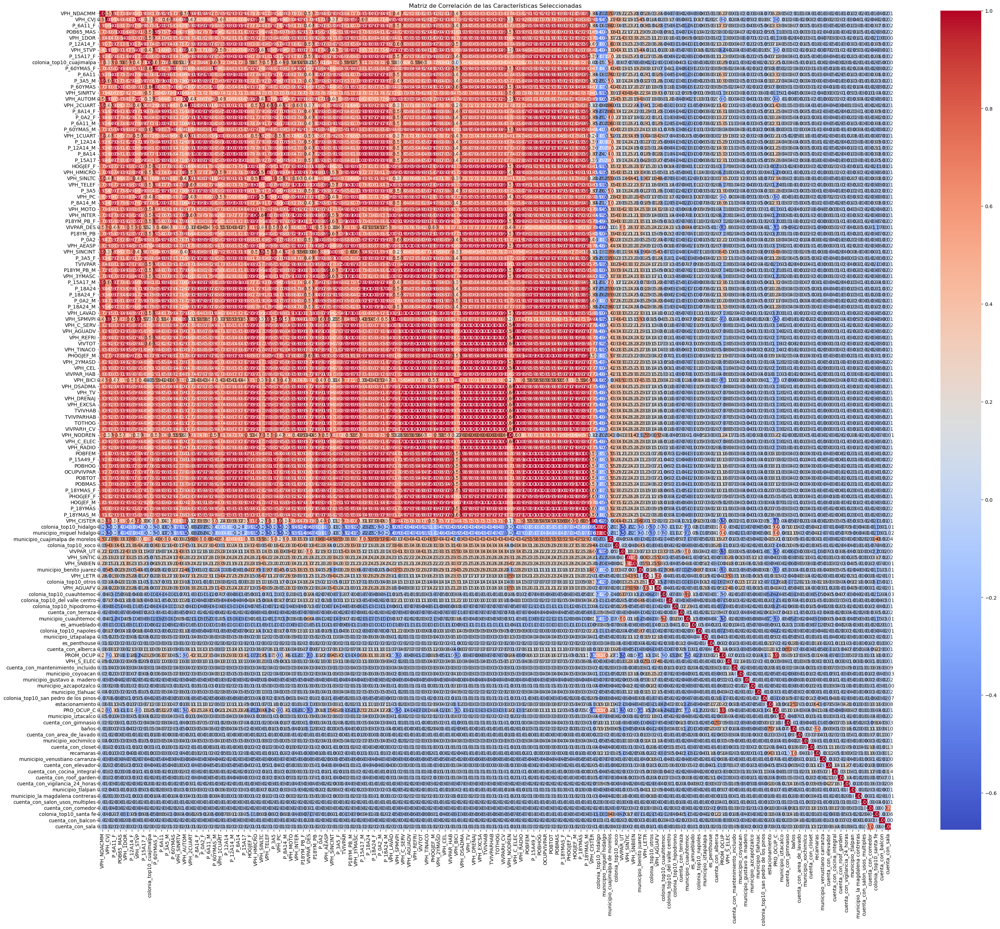

In [123]:
# Calcular la matriz de correlación para las características seleccionadas
correlation_matrix = df[final_features].corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(36, 30))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlación de las Características Seleccionadas")
plt.show()

In [124]:
# Establecer un umbral para considerar alta correlación
correlation_threshold = 0.60

# Identificar pares de características altamente correlacionadas
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

print(f"Pares de características altamente correlacionadas (umbral > {correlation_threshold}):")
high_corr_pairs

Pares de características altamente correlacionadas (umbral > 0.6):


[('P_6A11_F', 'VPH_NDACMM'),
 ('P_6A11_F', 'VPH_CVJ'),
 ('POB65_MAS', 'VPH_NDACMM'),
 ('POB65_MAS', 'VPH_CVJ'),
 ('POB65_MAS', 'P_6A11_F'),
 ('VPH_1DOR', 'VPH_NDACMM'),
 ('VPH_1DOR', 'VPH_CVJ'),
 ('VPH_1DOR', 'P_6A11_F'),
 ('VPH_1DOR', 'POB65_MAS'),
 ('P_12A14_F', 'VPH_NDACMM'),
 ('P_12A14_F', 'VPH_CVJ'),
 ('P_12A14_F', 'P_6A11_F'),
 ('P_12A14_F', 'POB65_MAS'),
 ('P_12A14_F', 'VPH_1DOR'),
 ('VPH_STVP', 'VPH_NDACMM'),
 ('VPH_STVP', 'VPH_CVJ'),
 ('VPH_STVP', 'P_6A11_F'),
 ('VPH_STVP', 'POB65_MAS'),
 ('VPH_STVP', 'VPH_1DOR'),
 ('VPH_STVP', 'P_12A14_F'),
 ('P_15A17_F', 'VPH_NDACMM'),
 ('P_15A17_F', 'VPH_CVJ'),
 ('P_15A17_F', 'P_6A11_F'),
 ('P_15A17_F', 'POB65_MAS'),
 ('P_15A17_F', 'VPH_1DOR'),
 ('P_15A17_F', 'P_12A14_F'),
 ('P_15A17_F', 'VPH_STVP'),
 ('colonia_top10_cuajimalpa', 'VPH_NDACMM'),
 ('colonia_top10_cuajimalpa', 'P_6A11_F'),
 ('colonia_top10_cuajimalpa', 'P_12A14_F'),
 ('colonia_top10_cuajimalpa', 'P_15A17_F'),
 ('P_60YMAS_F', 'VPH_NDACMM'),
 ('P_60YMAS_F', 'VPH_CVJ'),
 ('P_60YM

In [125]:
# Crear un conjunto para almacenar las características a eliminar
features_to_remove = set()

# Para cada par de características correlacionadas, eliminar la menos importante según PCA
for feature1, feature2 in high_corr_pairs:
    if feature_importance_pca[feature1] < feature_importance_pca[feature2]:
        features_to_remove.add(feature1)
    else:
        features_to_remove.add(feature2)

# Filtrar las características finales eliminando las correlacionadas menos importantes
final_features_filtered = [feature for feature in final_features if feature not in features_to_remove]

print(f"Características finales después de eliminar correlacionadas: {len(final_features_filtered)}")
final_features_filtered

Características finales después de eliminar correlacionadas: 40


['VPH_NDACMM',
 'VPH_CVJ',
 'colonia_top10_xoco',
 'VPH_SINTIC',
 'VPH_LETR',
 'colonia_top10_otros',
 'colonia_top10_cuauhtemoc',
 'colonia_top10_del valle centro',
 'colonia_top10_hipodromo',
 'cuenta_con_terraza',
 'es_amueblado',
 'colonia_top10_napoles',
 'municipio_iztapalapa',
 'es_penthouse',
 'cuenta_con_alberca',
 'VPH_S_ELEC',
 'cuenta_con_mantenimiento_incluido',
 'municipio_coyoacan',
 'municipio_gustavo a. madero',
 'municipio_azcapotzalco',
 'municipio_tlahuac',
 'colonia_top10_san pedro de los pinos',
 'estacionamiento',
 'municipio_iztacalco',
 'cuenta_con_gimnasio',
 'baños',
 'cuenta_con_area_de_lavado',
 'municipio_xochimilco',
 'cuenta_con_closet',
 'municipio_venustiano carranza',
 'cuenta_con_elevador',
 'cuenta_con_cocina_integral',
 'cuenta_con_roof_garden',
 'cuenta_con_vigilancia_24_horas',
 'municipio_tlalpan',
 'municipio_la magdalena contreras',
 'cuenta_con_salon_usos_multiples',
 'cuenta_con_comedor',
 'colonia_top10_santa fe',
 'cuenta_con_balcon']

In [126]:
final_features = final_features_filtered.copy()

# Entrenamiento de Modelos

## Regresión Lineal

Usando todas las 40 features
Forma del dataset: X (11866, 40), y (11866,)
Features seleccionadas: ['VPH_NDACMM', 'VPH_CVJ', 'colonia_top10_xoco', 'VPH_SINTIC', 'VPH_LETR', 'colonia_top10_otros', 'colonia_top10_cuauhtemoc', 'colonia_top10_del valle centro', 'colonia_top10_hipodromo', 'cuenta_con_terraza', 'es_amueblado', 'colonia_top10_napoles', 'municipio_iztapalapa', 'es_penthouse', 'cuenta_con_alberca', 'VPH_S_ELEC', 'cuenta_con_mantenimiento_incluido', 'municipio_coyoacan', 'municipio_gustavo a. madero', 'municipio_azcapotzalco', 'municipio_tlahuac', 'colonia_top10_san pedro de los pinos', 'estacionamiento', 'municipio_iztacalco', 'cuenta_con_gimnasio', 'baños', 'cuenta_con_area_de_lavado', 'municipio_xochimilco', 'cuenta_con_closet', 'municipio_venustiano carranza', 'cuenta_con_elevador', 'cuenta_con_cocina_integral', 'cuenta_con_roof_garden', 'cuenta_con_vigilancia_24_horas', 'municipio_tlalpan', 'municipio_la magdalena contreras', 'cuenta_con_salon_usos_multiples', 'cuenta_con_co

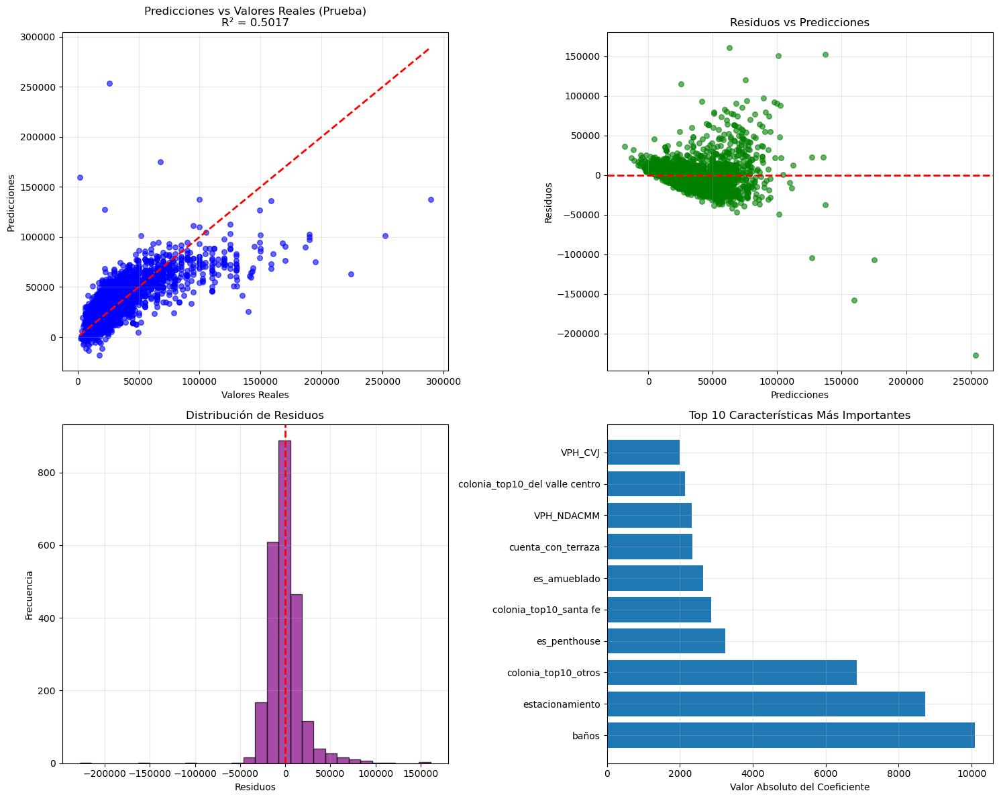


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   3.792474e+08 3.764794e+08
   RMSE   1.947428e+04 1.940308e+04
    MAE   1.276584e+04 1.264894e+04
     R²   5.430342e-01 5.016945e-01

✅ Modelo con buen rendimiento y generalización

Modelo entrenado exitosamente con 40 características


In [127]:
# Regresión Lineal con Pipeline Completo
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import time

# Seleccionar las características (X) y la variable objetivo (y)
target_column = 'precio_mxn'

# Filtrar features antes de 'random' si existe
if 'random' in final_features:
    final_features_filtered = final_features[:final_features.index('random')]
    print(f"Filtradas {len(final_features_filtered)} features antes de 'random'")
else:
    final_features_filtered = final_features
    print(f"Usando todas las {len(final_features_filtered)} features")

X = df[final_features_filtered]
y = df[target_column]

print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar valores faltantes
print(f"\nValores faltantes en X: {X.isnull().sum().sum()}")
print(f"Valores faltantes en y: {y.isnull().sum()}")

# Eliminar filas con valores faltantes si los hay
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=None  # Para regresión no usamos stratify
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# Crear el pipeline con StandardScaler y LinearRegression
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])

# Entrenar el modelo
print("\nEntrenando el modelo...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time 
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de coeficientes
scaler = pipeline.named_steps['scaler']
regressor = pipeline.named_steps['regressor']

# Obtener coeficientes e importancia
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'coefficient': regressor.coef_,
    'abs_coefficient': np.abs(regressor.coef_)
}).sort_values('abs_coefficient', ascending=False)

print(f"\nTop 10 características más importantes:")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='blue', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='red', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba)\nR² = {test_metrics['r2']:.4f}")
axes[0,0].set_xlabel("Valores Reales")
axes[0,0].set_ylabel("Predicciones")
axes[0,0].grid(True, alpha=0.3)

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='green', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones")
axes[0,1].set_xlabel("Predicciones")
axes[0,1].set_ylabel("Residuos")
axes[0,1].grid(True, alpha=0.3)

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.7, color='purple', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos")
axes[1,0].set_xlabel("Residuos")
axes[1,0].set_ylabel("Frecuencia")
axes[1,0].grid(True, alpha=0.3)

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['abs_coefficient'])
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'])
axes[1,1].set_title("Top 10 Características Más Importantes")
axes[1,1].set_xlabel("Valor Absoluto del Coeficiente")
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
if train_metrics['r2'] - test_metrics['r2'] > 0.1:
    print(f"\n⚠️  Posible overfitting detectado:")
    print(f"   Diferencia R²: {train_metrics['r2'] - test_metrics['r2']:.4f}")
elif test_metrics['r2'] < 0.5:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo con buen rendimiento y generalización")

# Guardar el modelo entrenado y métricas
model_results_linear = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo entrenado exitosamente con {len(final_features_filtered)} características")


### RandomForestRegressor

Forma del dataset: X (11866, 40), y (11866,)
Features seleccionadas: ['VPH_NDACMM', 'VPH_CVJ', 'colonia_top10_xoco', 'VPH_SINTIC', 'VPH_LETR', 'colonia_top10_otros', 'colonia_top10_cuauhtemoc', 'colonia_top10_del valle centro', 'colonia_top10_hipodromo', 'cuenta_con_terraza', 'es_amueblado', 'colonia_top10_napoles', 'municipio_iztapalapa', 'es_penthouse', 'cuenta_con_alberca', 'VPH_S_ELEC', 'cuenta_con_mantenimiento_incluido', 'municipio_coyoacan', 'municipio_gustavo a. madero', 'municipio_azcapotzalco', 'municipio_tlahuac', 'colonia_top10_san pedro de los pinos', 'estacionamiento', 'municipio_iztacalco', 'cuenta_con_gimnasio', 'baños', 'cuenta_con_area_de_lavado', 'municipio_xochimilco', 'cuenta_con_closet', 'municipio_venustiano carranza', 'cuenta_con_elevador', 'cuenta_con_cocina_integral', 'cuenta_con_roof_garden', 'cuenta_con_vigilancia_24_horas', 'municipio_tlalpan', 'municipio_la magdalena contreras', 'cuenta_con_salon_usos_multiples', 'cuenta_con_comedor', 'colonia_top10_santa 

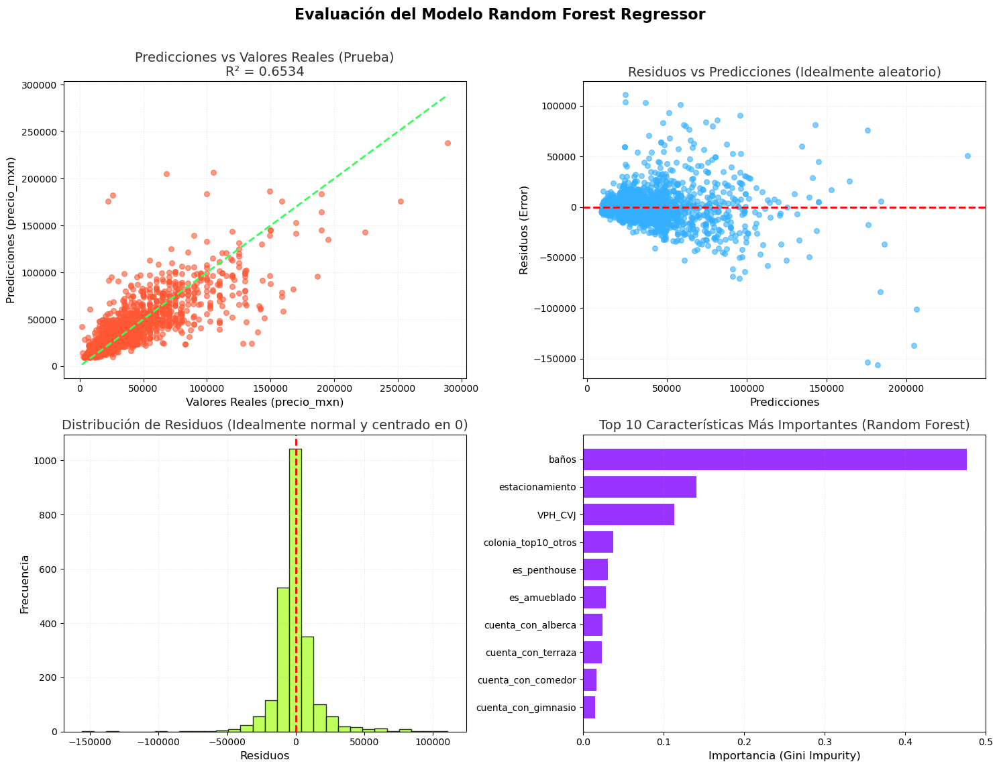


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   1.554325e+08 2.618980e+08
   RMSE   1.246726e+04 1.618326e+04
    MAE   7.973012e+03 9.356610e+03
     R²   8.127150e-01 6.533536e-01

⚠️  Random Forest detectado con posible sobreajuste (Overfitting):
   Diferencia R² (Entrenamiento - Prueba): 0.1594
   Considera reducir max_depth o aumentar min_samples_split.

Modelo Random Forest entrenado exitosamente con 40 características


In [128]:
# Regresión No Lineal con Pipeline (Random Forest Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
# Importamos el nuevo modelo: Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Ejemplo de variables si no estuvieran definidas:
# data_size = 500
# final_features = [f'feature_{i}' for i in range(5)]
# df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
# df['precio_mxn'] = df.iloc[:, 0] * 100 + df.iloc[:, 1] * 50 + np.random.randn(data_size) * 10
# target_column = 'precio_mxn'
# -------------------------------------------------------------------------

# Seleccionar las características (X) y la variable objetivo (y)
# Suponiendo que df, final_features y target_column ya están cargados/definidos
# Aquí usaremos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar LinearRegression por RandomForestRegressor ---
# Random Forest es un modelo de ensamble basado en árboles que captura no linealidades.
# El StandardScaler (escalamiento) es menos crítico aquí, pero se mantiene en el pipeline.
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor(
        n_estimators=100,  # Número de árboles en el bosque
        max_depth=10,      # Profundidad máxima de los árboles para evitar sobreajuste
        random_state=42,
        n_jobs=-1          # Usa todos los núcleos de CPU disponibles
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo Random Forest...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (Random Forest)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (Random Forest)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características (diferente al de Regresión Lineal)
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características del Random Forest
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (Random Forest):")
# Usamos 'importance' en lugar de 'abs_coefficient'
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas (reutilizando la estructura de la gráfica)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#FF5733', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#33FF57', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#33AFFF', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (Idealmente aleatorio)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#AFFF33', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (Idealmente normal y centrado en 0)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#9A33FF')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (Random Forest)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia (Gini Impurity)", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo Random Forest Regressor", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
# En Random Forest, la diferencia R² tiende a ser mayor, pero el R² de prueba debe ser alto.
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.15: # Un umbral más alto para modelos de árbol
    print(f"\n⚠️  Random Forest detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera reducir max_depth o aumentar min_samples_split.")
elif test_metrics['r2'] < 0.6:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo Random Forest con buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_rf = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo Random Forest entrenado exitosamente con {len(final_features_filtered)} características")


## GradientBoostingRegressor

Forma del dataset: X (11866, 40), y (11866,)
Features seleccionadas: ['VPH_NDACMM', 'VPH_CVJ', 'colonia_top10_xoco', 'VPH_SINTIC', 'VPH_LETR', 'colonia_top10_otros', 'colonia_top10_cuauhtemoc', 'colonia_top10_del valle centro', 'colonia_top10_hipodromo', 'cuenta_con_terraza', 'es_amueblado', 'colonia_top10_napoles', 'municipio_iztapalapa', 'es_penthouse', 'cuenta_con_alberca', 'VPH_S_ELEC', 'cuenta_con_mantenimiento_incluido', 'municipio_coyoacan', 'municipio_gustavo a. madero', 'municipio_azcapotzalco', 'municipio_tlahuac', 'colonia_top10_san pedro de los pinos', 'estacionamiento', 'municipio_iztacalco', 'cuenta_con_gimnasio', 'baños', 'cuenta_con_area_de_lavado', 'municipio_xochimilco', 'cuenta_con_closet', 'municipio_venustiano carranza', 'cuenta_con_elevador', 'cuenta_con_cocina_integral', 'cuenta_con_roof_garden', 'cuenta_con_vigilancia_24_horas', 'municipio_tlalpan', 'municipio_la magdalena contreras', 'cuenta_con_salon_usos_multiples', 'cuenta_con_comedor', 'colonia_top10_santa 

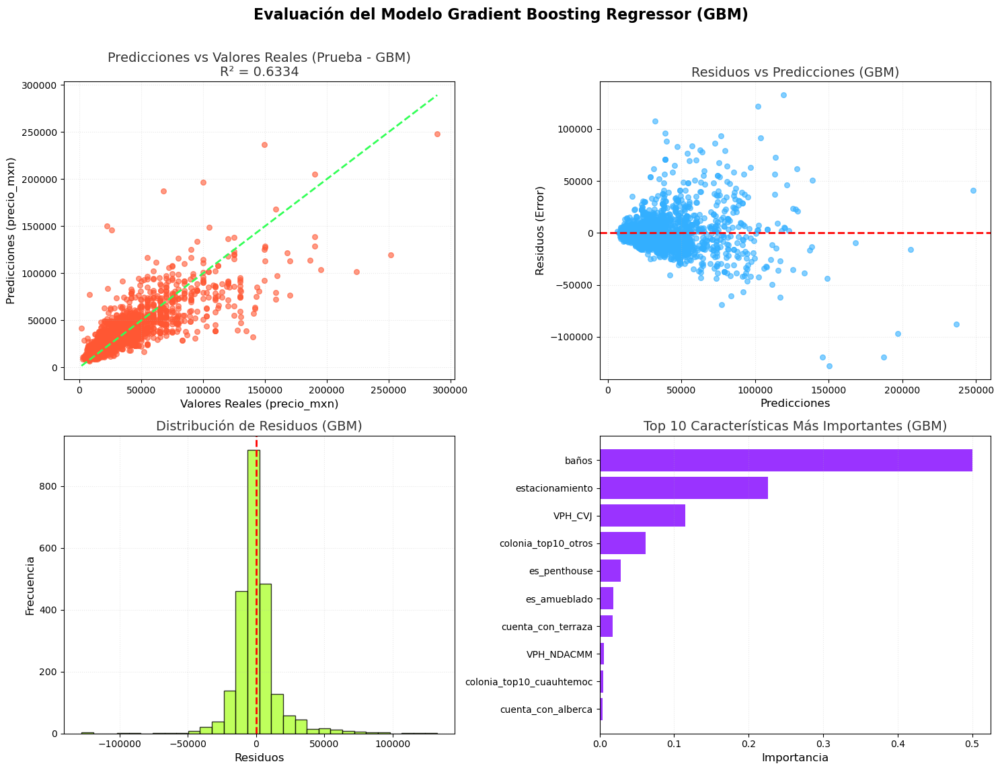


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   2.595389e+08 2.769833e+08
   RMSE   1.611021e+04 1.664281e+04
    MAE   1.011755e+04 1.013024e+04
     R²   6.872744e-01 6.333868e-01

⚠️  Modelo con bajo rendimiento:
   R² en prueba: 0.6334

Modelo Gradient Boosting entrenado exitosamente con 40 características


In [129]:
# Regresión No Lineal con Pipeline (Gradient Boosting Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
# Importamos el nuevo modelo: Gradient Boosting Regressor (GBM)
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Ejemplo de variables si no estuvieran definidas:
# data_size = 500
# final_features = [f'feature_{i}' for i in range(5)]
# df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
# df['precio_mxn'] = df.iloc[:, 0] * 100 + df.iloc[:, 1] * 50 + np.random.randn(data_size) * 10
# target_column = 'precio_mxn'
# -------------------------------------------------------------------------

# Seleccionar las características (X) y la variable objetivo (y)
# Suponiendo que df, final_features y target_column ya están cargados/definidos
# Aquí usaremos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar RandomForestRegressor por GradientBoostingRegressor (GBM) ---
# GBM es un modelo de ensamble basado en boosting (aprendizaje secuencial) que a menudo 
# ofrece un mejor rendimiento que Random Forest.
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', GradientBoostingRegressor(
        n_estimators=100,      # Número de etapas de boosting (árboles)
        learning_rate=0.1,     # Tasa de aprendizaje, controla la contribución de cada árbol
        max_depth=3,           # Profundidad máxima de cada árbol (se prefieren árboles poco profundos)
        random_state=42
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo Gradient Boosting Regressor (GBM)...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (GBM)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (GBM)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características (misma forma que Random Forest)
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características del Gradient Boosting
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (Gradient Boosting):")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas (reutilizando la estructura de la gráfica)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#FF5733', s=30)
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#33FF57', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba - GBM)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#33AFFF', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (GBM)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#AFFF33', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (GBM)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#9A33FF')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (GBM)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo Gradient Boosting Regressor (GBM)", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
# GBM es más propenso al sobreajuste que Random Forest, por lo que el umbral es más estricto.
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.08: # Bajamos el umbral para modelos de boosting (0.08 es más estricto)
    print(f"\n⚠️  Gradient Boosting detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera reducir el 'learning_rate', aumentar 'n_estimators' o usar 'subsample'.")
elif test_metrics['r2'] < 0.7:
    print(f"\n⚠️  Modelo con bajo rendimiento:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo Gradient Boosting con buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_gbm = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo Gradient Boosting entrenado exitosamente con {len(final_features_filtered)} características")


Forma del dataset: X (11866, 40), y (11866,)
Features seleccionadas: ['VPH_NDACMM', 'VPH_CVJ', 'colonia_top10_xoco', 'VPH_SINTIC', 'VPH_LETR', 'colonia_top10_otros', 'colonia_top10_cuauhtemoc', 'colonia_top10_del valle centro', 'colonia_top10_hipodromo', 'cuenta_con_terraza', 'es_amueblado', 'colonia_top10_napoles', 'municipio_iztapalapa', 'es_penthouse', 'cuenta_con_alberca', 'VPH_S_ELEC', 'cuenta_con_mantenimiento_incluido', 'municipio_coyoacan', 'municipio_gustavo a. madero', 'municipio_azcapotzalco', 'municipio_tlahuac', 'colonia_top10_san pedro de los pinos', 'estacionamiento', 'municipio_iztacalco', 'cuenta_con_gimnasio', 'baños', 'cuenta_con_area_de_lavado', 'municipio_xochimilco', 'cuenta_con_closet', 'municipio_venustiano carranza', 'cuenta_con_elevador', 'cuenta_con_cocina_integral', 'cuenta_con_roof_garden', 'cuenta_con_vigilancia_24_horas', 'municipio_tlalpan', 'municipio_la magdalena contreras', 'cuenta_con_salon_usos_multiples', 'cuenta_con_comedor', 'colonia_top10_santa 

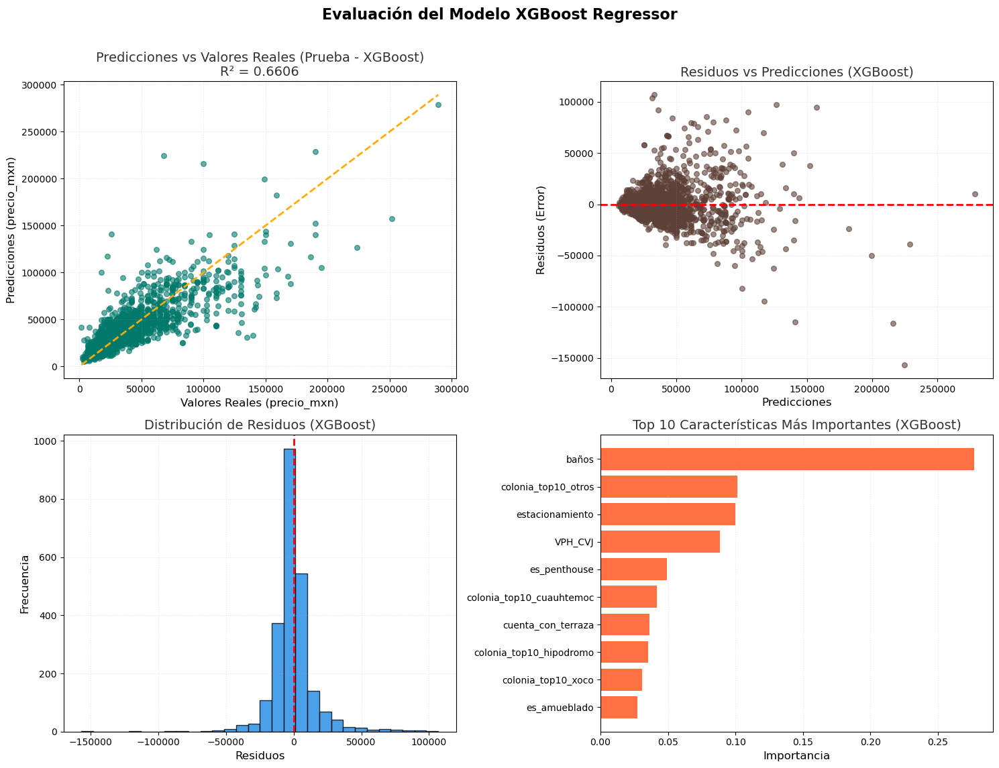


Comparación Entrenamiento vs Prueba:
Métrica  Entrenamiento       Prueba
    MSE   2.067527e+08 2.564547e+08
   RMSE   1.437890e+04 1.601420e+04
    MAE   9.025707e+03 9.606954e+03
     R²   7.508780e-01 6.605582e-01

⚠️  XGBoost detectado con posible sobreajuste (Overfitting):
   Diferencia R² (Entrenamiento - Prueba): 0.0903
   Considera aumentar el valor de 'reg_alpha' (L1) o 'reg_lambda' (L2), o reducir 'max_depth'.

Modelo XGBoost entrenado exitosamente con 40 características


In [130]:
# Regresión No Lineal Avanzada con Pipeline (XGBoost Regressor)
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Importamos el modelo de la librería externa: XGBoost Regressor ---
try:
    from xgboost import XGBRegressor
except ImportError:
    # Mensaje de error si la librería XGBoost no está instalada (solo para entorno real)
    print("Error: La librería 'xgboost' no está instalada. Por favor, instálela con 'pip install xgboost'")
    raise

# --- Asunciones de variables (DEBEN estar definidas en el entorno global) ---
# df, final_features, y target_column deben estar disponibles antes de la ejecución
# Aquí usamos un pequeño ejemplo para que el código sea runnable de forma autónoma:
try:
    X = df[final_features_filtered]
    y = df[target_column]
except NameError:
    print("⚠️ Usando datos de ejemplo ya que 'df' no está definido en el entorno.")
    data_size = 1000
    final_features = [f'area_m2', 'num_habitaciones', 'distancia_centro_km', 'antiguedad_anos', 'dummy_col']
    df = pd.DataFrame(np.random.rand(data_size, 5), columns=final_features)
    df['precio_mxn'] = (df['area_m2'] * 500000) + (df['num_habitaciones'] * 100000) + (np.random.randn(data_size) * 50000)
    target_column = 'precio_mxn'
    final_features_filtered = final_features
    X = df[final_features_filtered]
    y = df[target_column]


print(f"Forma del dataset: X {X.shape}, y {y.shape}")
print(f"Features seleccionadas: {final_features_filtered}")

# Verificar y limpiar valores faltantes (mismo código que el original)
if X.isnull().sum().sum() > 0 or y.isnull().sum() > 0:
    mask = ~(X.isnull().any(axis=1) | y.isnull())
    X = X[mask]
    y = y[mask]
    print(f"Después de eliminar NaN: X {X.shape}, y {y.shape}")

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42
)

print(f"\nDivisión de datos:")
print(f"Entrenamiento: X {X_train.shape}, y {y_train.shape}")
print(f"Prueba: X {X_test.shape}, y {y_test.shape}")

# --- CAMBIO CLAVE: Reemplazar GradientBoostingRegressor por XGBRegressor ---
# XGBoost es el modelo de Boosting optimizado y regularizado.
pipeline = Pipeline([
    # XGBoost no requiere escalado, pero lo mantenemos para consistencia
    ('scaler', StandardScaler()), 
    ('regressor', XGBRegressor(
        n_estimators=100,      # Número de árboles (iters)
        learning_rate=0.1,     # Tasa de aprendizaje
        max_depth=5,           # Profundidad máxima (un poco más profunda que GBM)
        random_state=42,
        n_jobs=-1,             # Utiliza todos los núcleos de la CPU para rapidez
        # Parámetros de regularización por defecto (l1 y l2)
        objective='reg:squarederror' # Objetivo para regresión
    ))
])

# Entrenar el modelo
print("\nEntrenando el modelo XGBoost Regressor...")
start_time = time.time()
pipeline.fit(X_train, y_train)
end_time = time.time()

training_time = end_time - start_time
print(f"Entrenamiento completado en {training_time:.2f} segundos.")

# Realizar predicciones
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Evaluar el modelo (función de evaluación reutilizada)
def evaluate_model(y_true, y_pred, dataset_name=""):
    """Función para evaluar el modelo con múltiples métricas"""
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    print(f"\nResultados {dataset_name}:")
    print(f"Error cuadrático medio (MSE): {mse:,.2f}")
    print(f"Raíz del error cuadrático medio (RMSE): {rmse:,.2f}")
    print(f"Error absoluto medio (MAE): {mae:,.2f}")
    print(f"Coeficiente de determinación (R²): {r2:.4f}")
    
    return {'mse': mse, 'rmse': rmse, 'mae': mae, 'r2': r2}

# Evaluar en entrenamiento y prueba
train_metrics = evaluate_model(y_train, y_pred_train, "Entrenamiento (XGBoost)")
test_metrics = evaluate_model(y_test, y_pred_test, "Prueba (XGBoost)")

# Validación cruzada
print(f"\nValidación cruzada (5-fold):")
cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2', n_jobs=-1)
print(f"R² promedio: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

cv_scores_rmse = cross_val_score(pipeline, X_train, y_train, cv=5, 
                                scoring='neg_mean_squared_error', n_jobs=-1)
cv_rmse = np.sqrt(-cv_scores_rmse)
print(f"RMSE promedio: {cv_rmse.mean():,.2f} (+/- {cv_rmse.std() * 2:,.2f})")

# Análisis de Importancia de Características
regressor = pipeline.named_steps['regressor']

# Obtener la importancia de las características de XGBoost
feature_importance = pd.DataFrame({
    'feature': final_features_filtered,
    'importance': regressor.feature_importances_
}).sort_values('importance', ascending=False)

print(f"\nTop 10 características más importantes (XGBoost):")
print(feature_importance.head(10).to_string(index=False))

# Visualizaciones mejoradas
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# 1. Predicciones vs Valores Reales (Prueba)
axes[0,0].scatter(y_test, y_pred_test, alpha=0.6, color='#00796B', s=30) # Nuevo color
axes[0,0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 
               color='#FFAB00', linestyle='--', linewidth=2)
axes[0,0].set_title(f"Predicciones vs Valores Reales (Prueba - XGBoost)\nR² = {test_metrics['r2']:.4f}", 
                    fontsize=14, color='#333333')
axes[0,0].set_xlabel("Valores Reales (precio_mxn)", fontsize=12)
axes[0,0].set_ylabel("Predicciones (precio_mxn)", fontsize=12)
axes[0,0].grid(True, alpha=0.3, linestyle=':')

# 2. Residuos vs Predicciones
residuals_test = y_test - y_pred_test
axes[0,1].scatter(y_pred_test, residuals_test, alpha=0.6, color='#5D4037', s=30)
axes[0,1].axhline(y=0, color='red', linestyle='--', linewidth=2)
axes[0,1].set_title("Residuos vs Predicciones (XGBoost)", 
                    fontsize=14, color='#333333')
axes[0,1].set_xlabel("Predicciones", fontsize=12)
axes[0,1].set_ylabel("Residuos (Error)", fontsize=12)
axes[0,1].grid(True, alpha=0.3, linestyle=':')

# 3. Distribución de residuos
axes[1,0].hist(residuals_test, bins=30, alpha=0.8, color='#1E88E5', edgecolor='black')
axes[1,0].axvline(x=0, color='red', linestyle='--', linewidth=2)
axes[1,0].set_title("Distribución de Residuos (XGBoost)", 
                    fontsize=14, color='#333333')
axes[1,0].set_xlabel("Residuos", fontsize=12)
axes[1,0].set_ylabel("Frecuencia", fontsize=12)
axes[1,0].grid(True, alpha=0.3, linestyle=':')

# 4. Importancia de características (Top 10)
top_10_features = feature_importance.head(10)
axes[1,1].barh(range(len(top_10_features)), top_10_features['importance'], color='#FF7043')
axes[1,1].set_yticks(range(len(top_10_features)))
axes[1,1].set_yticklabels(top_10_features['feature'], fontsize=10)
axes[1,1].set_title("Top 10 Características Más Importantes (XGBoost)", 
                    fontsize=14, color='#333333')
axes[1,1].set_xlabel("Importancia", fontsize=12)
axes[1,1].invert_yaxis() # Pone la más importante arriba
axes[1,1].grid(axis='x', alpha=0.3, linestyle=':')

plt.suptitle("Evaluación del Modelo XGBoost Regressor", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

# Comparación Entrenamiento vs Prueba
comparison_df = pd.DataFrame({
    'Métrica': ['MSE', 'RMSE', 'MAE', 'R²'],
    'Entrenamiento': [train_metrics['mse'], train_metrics['rmse'], 
                     train_metrics['mae'], train_metrics['r2']],
    'Prueba': [test_metrics['mse'], test_metrics['rmse'], 
              test_metrics['mae'], test_metrics['r2']]
})

print(f"\nComparación Entrenamiento vs Prueba:")
print(comparison_df.to_string(index=False))

# Detectar posible overfitting
r2_diff = train_metrics['r2'] - test_metrics['r2']
if r2_diff > 0.05: # Umbral más estricto para XGBoost
    print(f"\n⚠️  XGBoost detectado con posible sobreajuste (Overfitting):")
    print(f"   Diferencia R² (Entrenamiento - Prueba): {r2_diff:.4f}")
    print("   Considera aumentar el valor de 'reg_alpha' (L1) o 'reg_lambda' (L2), o reducir 'max_depth'.")
elif test_metrics['r2'] < 0.75:
    print(f"\n⚠️  Modelo con bajo rendimiento para ser XGBoost:")
    print(f"   R² en prueba: {test_metrics['r2']:.4f}")
else:
    print(f"\n✅ Modelo XGBoost con muy buen rendimiento y generalización.")

# Guardar el modelo entrenado y métricas (actualizado)
model_results_xgb = {
    'pipeline': pipeline,
    'train_metrics': train_metrics,
    'test_metrics': test_metrics,
    'feature_importance': feature_importance,
    'cv_scores': cv_scores,
    'training_time': training_time
}

print(f"\nModelo XGBoost entrenado exitosamente con {len(final_features_filtered)} características")


In [131]:
# Crear un diccionario para almacenar los resultados de los modelos
model_comparison = {}

# Lista de modelos entrenados previamente
models = {
    "Linear Regression": model_results_linear,  # Supongamos que este es el resultado del modelo de regresión lineal
    "Random Forest": model_results_rf,          # Resultado del modelo Random Forest
    "Gradient Boosting": model_results_gbm,     # Resultado del modelo Gradient Boosting
    "XGBoost": model_results_xgb                # Resultado del modelo XGBoost
}

# Evaluar cada modelo
for model_name, model_result in models.items():
    pipeline = model_result['pipeline']
    test_metrics = model_result['test_metrics']
    
    # Medir el tiempo de predicción
    start_time = time.time()
    y_pred_test = pipeline.predict(X_test)
    prediction_time = time.time() - start_time
    
    # Guardar los resultados en el diccionario
    model_comparison[model_name] = {
        "R² (Prueba)": test_metrics['r2'],
        "RMSE (Prueba)": test_metrics['rmse'],
        "MAE (Prueba)": test_metrics['mae'],
        "Tiempo de predicción (s)": prediction_time,
        "Tiempo de entrenamiento (s)": model_result.get('training_time', 'N/A'),  # Si se almacenó el tiempo de entrenamiento
        "Interpretabilidad": "Alta" if model_name == "Linear Regression" else "Media" if model_name == "Random Forest" else "Baja"
    }

# Crear un DataFrame para visualizar la comparación
comparison_df = pd.DataFrame(model_comparison).T

# Ordenar por R² en prueba
comparison_df = comparison_df.sort_values(by="R² (Prueba)", ascending=False)

print("Comparación de Modelos:")
print(comparison_df)

# Decidir el modelo final
best_model_name = comparison_df.index[0]
print(f"\nEl modelo seleccionado para producción es: {best_model_name}")

Comparación de Modelos:
                  R² (Prueba) RMSE (Prueba)  MAE (Prueba)  \
XGBoost              0.660558  16014.204603   9606.954014   
Random Forest        0.653354  16183.261801   9356.610081   
Gradient Boosting    0.633387  16642.814331  10130.241832   
Linear Regression    0.501694  19403.076172  12648.938894   

                  Tiempo de predicción (s) Tiempo de entrenamiento (s)  \
XGBoost                           0.020729                    0.109921   
Random Forest                     0.058975                    0.266236   
Gradient Boosting                 0.009573                    0.566635   
Linear Regression                 0.003616                    0.013273   

                  Interpretabilidad  
XGBoost                        Baja  
Random Forest                 Media  
Gradient Boosting              Baja  
Linear Regression              Alta  

El modelo seleccionado para producción es: XGBoost
